Analysis of cell sub types from single cell RNA Sequencing data for SKG mice Rheumatoid Arthritis Project


Last Updated on: August 10, 2021

# Import Python Packages

In [1]:
import sys

#Import libraries
#import scanorama
import time
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
#from skbio.stats.composition import clr

#import doubletdetection
import matplotlib.pyplot as plt
import matplotlib.axes as ax
import matplotlib
#import os
#For CLR of ADTs
import scipy
import scipy.stats
from sklearn.preprocessing import scale
import os
import copy
import itertools
import seaborn as sns
import math
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)


sc.logging.print_versions() 
sc.settings.set_figure_params(dpi=150)

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


scanpy==1.5.1 anndata==0.7.3 umap==0.4.3 numpy==1.22.4 scipy==1.10.1 pandas==1.0.3 scikit-learn==0.22.1 statsmodels==0.11.1 python-igraph==0.7.1 leidenalg==0.8.0


# Load Data


In [2]:
#Load data
path = 'adata_object/'
adata_file = path + 'adata_only_T_cells.h5ad'
adata = sc.read(adata_file)
print("done")

done


In [3]:
adata

AnnData object with n_obs × n_vars = 99074 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Create cell sub types and run diff exp

In [3]:
cell_type_dict = {'0':'0',
                  '1':'0',
                  '2':'1',
                  '3':'2',
                  '4':'2',
                  '5':'2',
                  '6':'2',
                  '7':'3',
                  '8':'4',
                  '9':'5',
                  '10':'6',
                  '11':'7',
                  '12':'8',}
cell_types = [cell_type_dict[x] for x in adata.obs['leiden']]
adata.obs['cell_types'] = cell_types

In [6]:
colors = adata.uns['cell_types_colors'] 

colors[0] = '#738276'
colors[1] = '#1F77B4'
colors[2] = '#d3d3d3'
colors[3] = '#e50000'
colors[4] = '#710193'
colors[5] = '#b5a642'
colors[6] = '#17becf'
colors[7] = '#ffa500' 
colors[8] = '#458B00' 

adata.uns['cell_types_colors'] = colors 

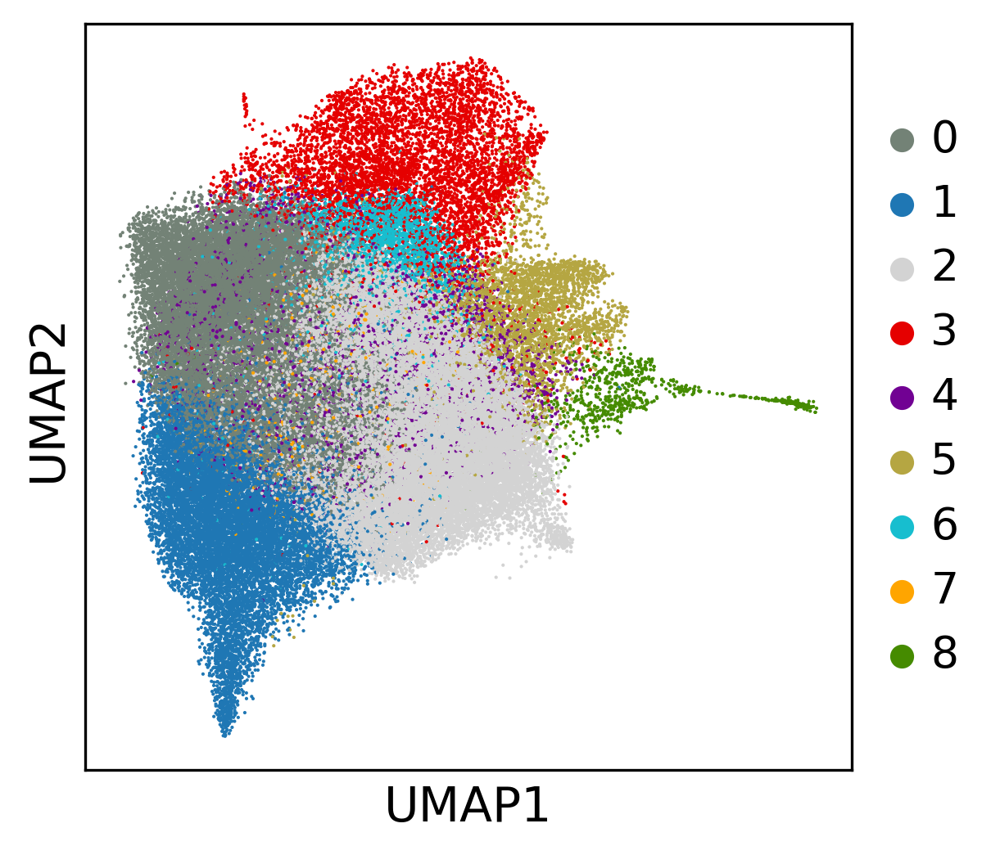

In [7]:
sc.pl.umap(adata, color = 'cell_types', title = "", size = 4)# ,  save = "_colored_by_cell_sub_type_fig2.svg")

In [ ]:
file_name = "results/single_cell_RNA_seq/data_S4_scRNAseq_diff_genes_by_cluster.csv"
sc.tl.rank_genes_groups(adata, 'cell_types', n_genes = len(adata.raw.var_names), use_raw=True, groups='all',
                           reference='rest', rankby_abs=False, key_added=None,
                           copy=False, method='wilcoxon',
                           corr_method='benjamini-hochberg', log_transformed=True, pts = True)

for cluster in np.unique(adata.obs['cell_types']):
    names = np.array(adata.uns['rank_genes_groups']['names'][cluster])
    logfoldchanges = np.array(adata.uns['rank_genes_groups']['logfoldchanges'][cluster])
    adj_p_val = np.array(adata.uns['rank_genes_groups']['pvals_adj'][cluster])
    cluster_result = pd.DataFrame(data = np.array([names,logfoldchanges,adj_p_val]), index= ["names","logfoldchange","adj_pval"])
    print("Cluster: ", cluster)
    #cluster_result = cluster_result.sort_values(by=['adj_pval'], axis=1, ascending=True, inplace=False, kind='quicksort', na_position='last')

    with open(file_name, 'a') as f:
        f.write("Cluster " + cluster + '\n')
        cluster_result.to_csv(f, header=False)

In [10]:
adata

AnnData object with n_obs × n_vars = 99074 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_type', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'batch_colors', 'genes', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params', 'cell_types_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# UMAPs by subgroup

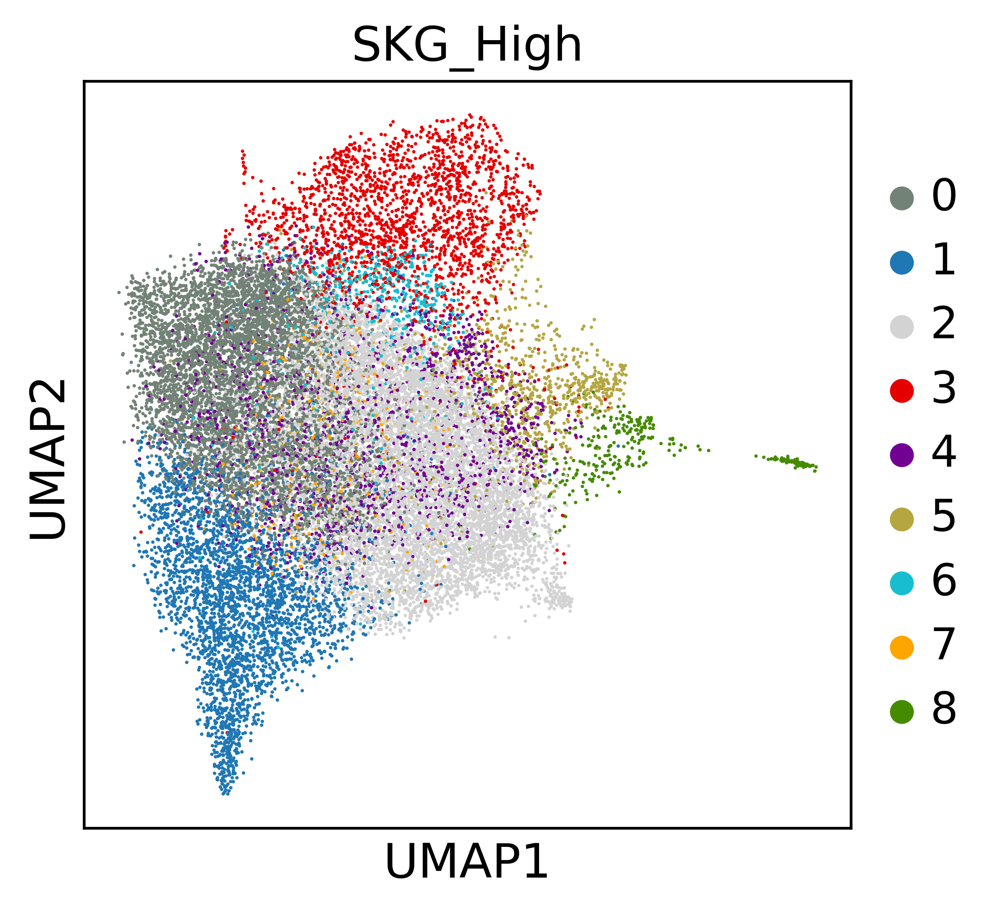

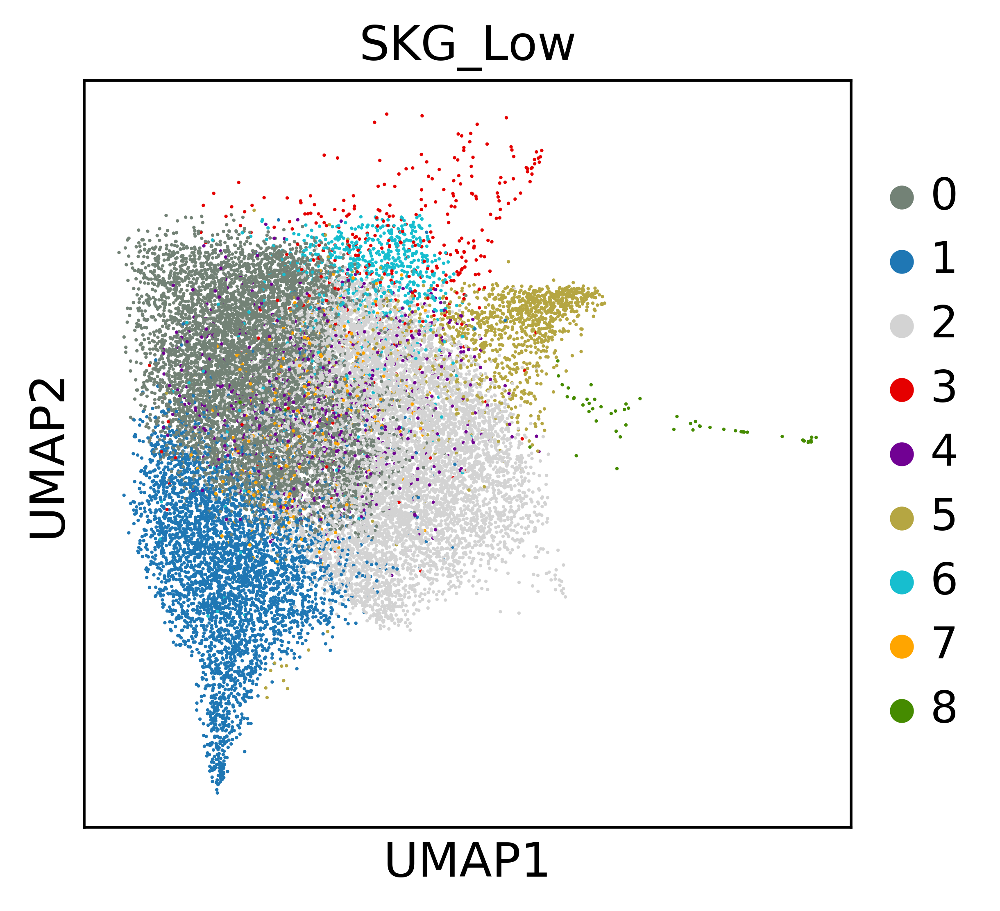

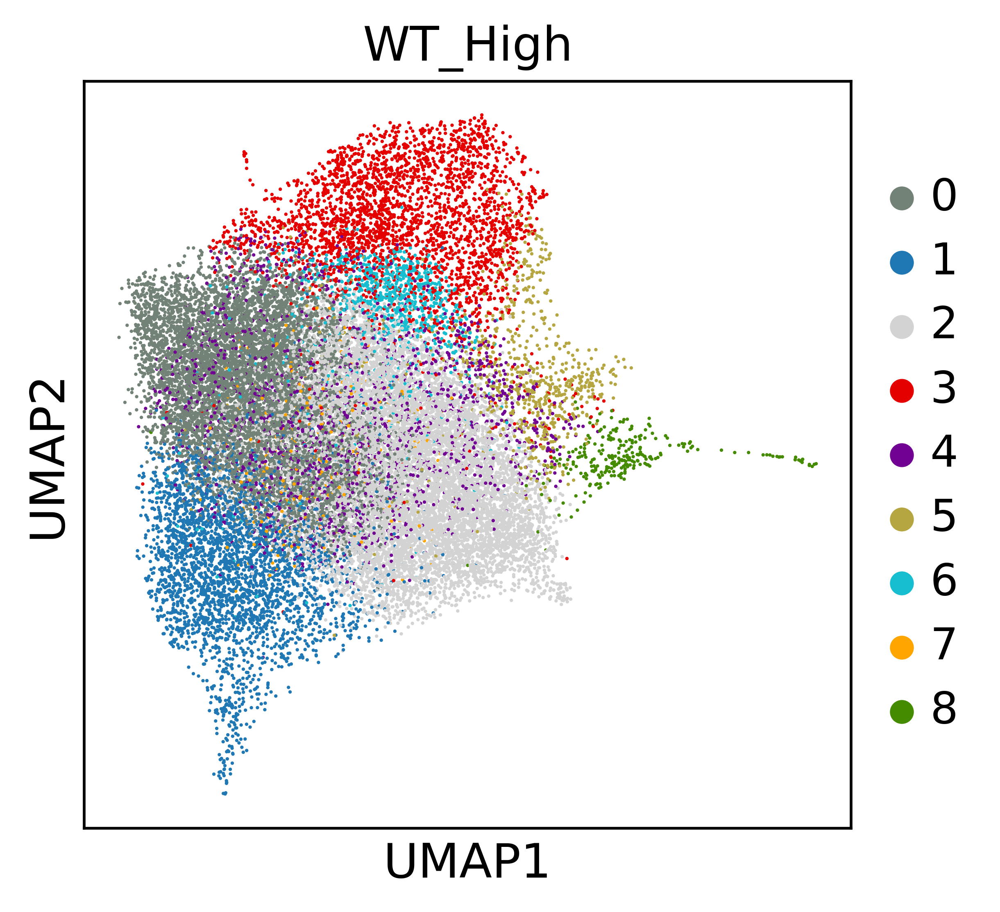

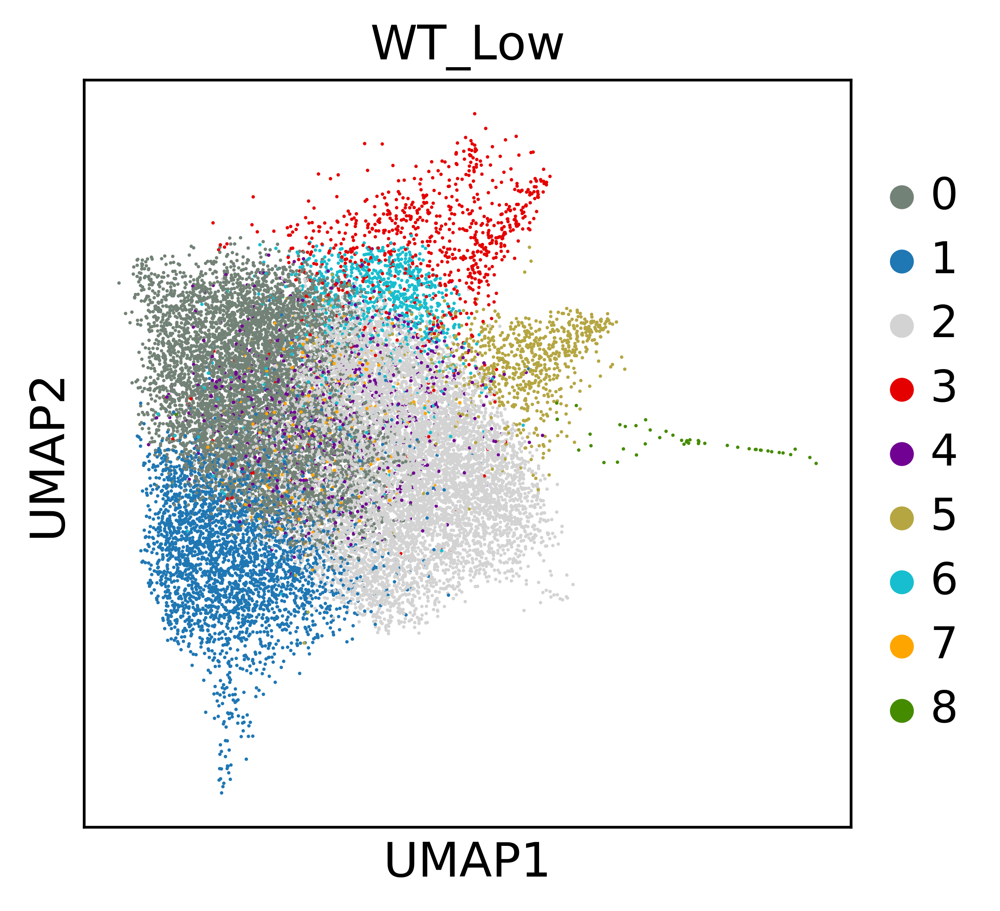

In [57]:
for group in np.unique(adata.obs['subgroup']):
    sc.pl.umap(adata[adata.obs['subgroup'] == group], color = 'cell_types', title = group, size = 4)# ,  save = "_colored_by_cell_sub_type_"+group+"_fig2.svg")

# Density UMAPs by subgroup

computing density on 'umap'
--> added
    'umap_density_subgroup', densities (adata.obs)
    'umap_density_subgroup_params', parameter (adata.uns)


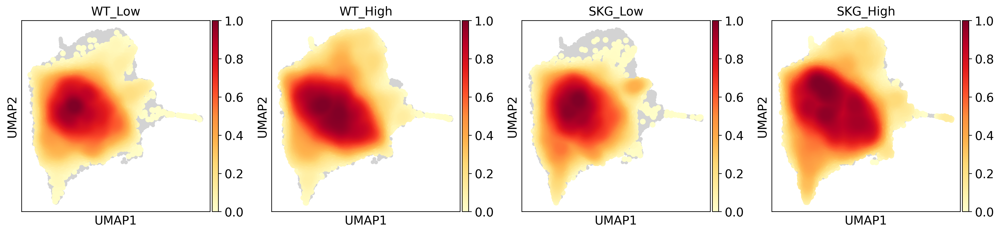

In [14]:

sc.tl.embedding_density(adata, basis='umap', groupby='subgroup')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_subgroup')#, save = "_colored_by_density_by_subgroup.svg")

# Stacked Violin Plots and Matrix Plots

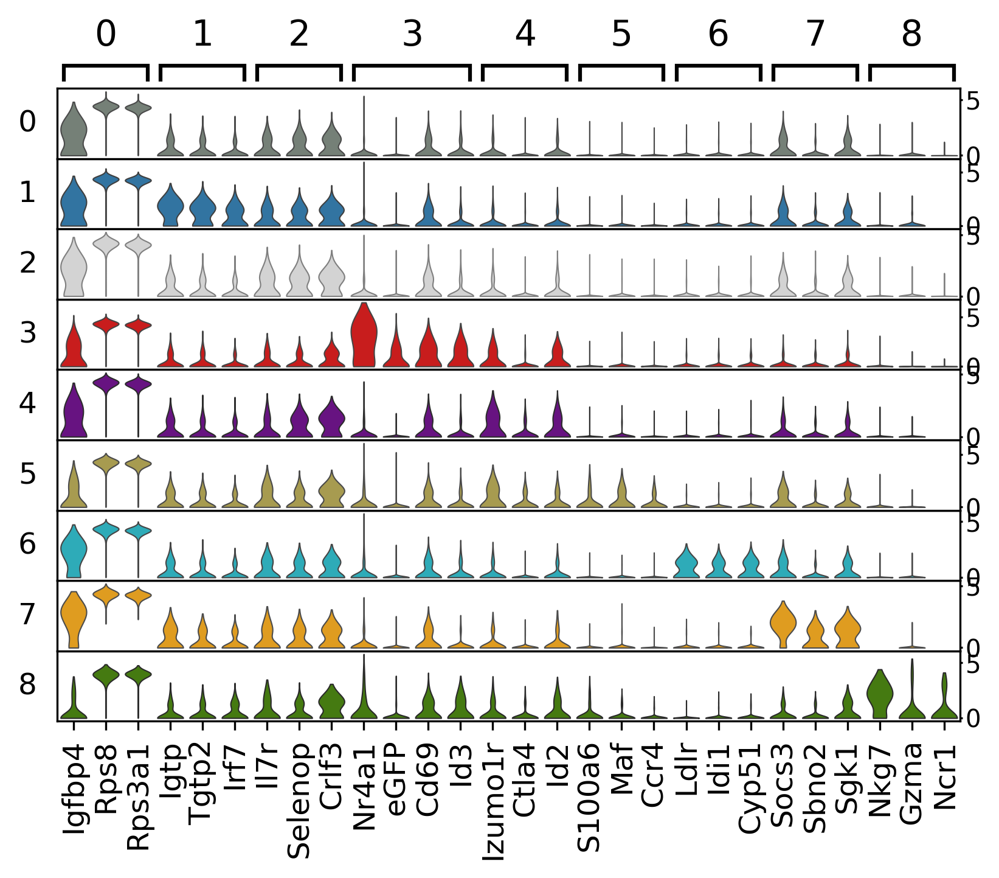

In [28]:
marker_genes_dict_cell_types = {'0': ['Igfbp4','Rps8','Rps3a1'],
     '1': ['Igtp','Tgtp2','Irf7'],
     '2': ['Il7r','Selenop','Crlf3'], 
     '3': ['Nr4a1','eGFP','Cd69','Id3',],
     '4': ['Izumo1r','Ctla4','Id2'], 
     '5': ['S100a6','Maf','Ccr4'], 
     '6': ['Ldlr','Idi1','Cyp51'],
     '7': ['Socs3','Sbno2','Sgk1'], 
     '8': ['Nkg7','Gzma','Ncr1'],}


sc.pl.stacked_violin(adata, marker_genes_dict_cell_types, groupby='cell_types', row_palette= [ '#ffa500', '#458B00', '#738276', '#1F77B4','#d3d3d3', '#e50000', '#710193', '#b5a642',
       '#17becf'], bw=0.5, scale='count', use_raw = True)

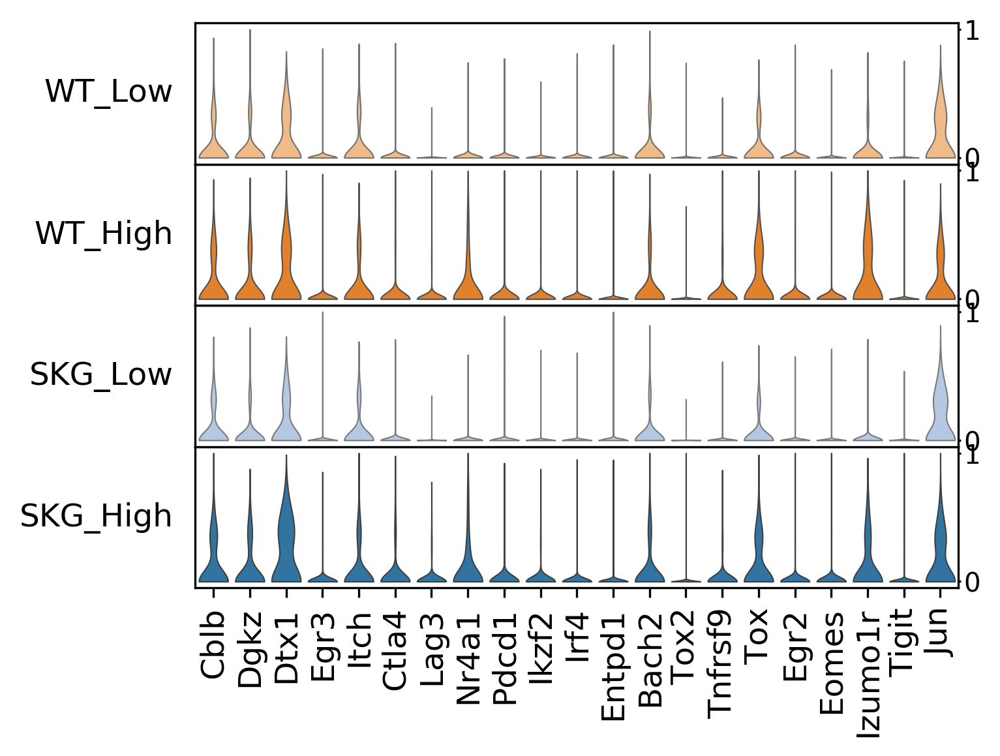

In [25]:
#Anergy/Exhaustion

genes = ["Cblb","Dgkz", "Dtx1", "Egr3", "Itch","Ctla4", "Lag3", "Nr4a1","Pdcd1",'Ikzf2','Irf4','Entpd1',
         'Bach2', 'Tox2',"Tnfrsf9",'Tox',  "Egr2",'Eomes',"Izumo1r",'Tigit', 'Jun']
sc.pl.stacked_violin(adata, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, row_palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], size = 0.3,  bw=0.5)#,save = "fig2_violin_plot_all_cells_anergy.svg")

... storing 'cell_types' as categorical


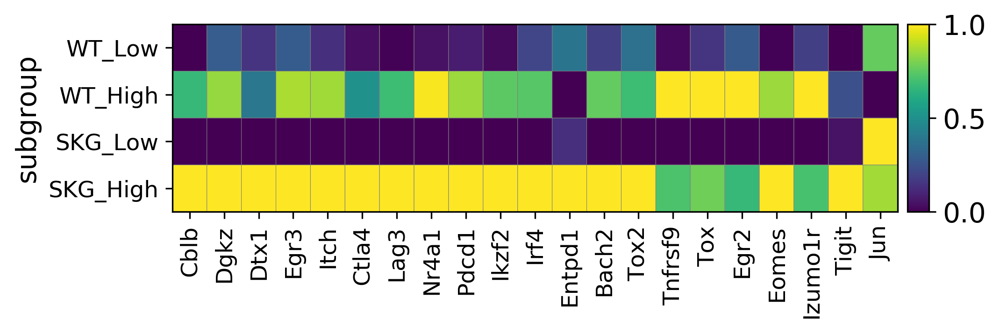

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[6.72, 0, 0.2])

In [52]:
#Anergy/Exhaustion

genes = ["Cblb","Dgkz", "Dtx1", "Egr3", "Itch","Ctla4", "Lag3", "Nr4a1","Pdcd1",'Ikzf2','Irf4','Entpd1',
         'Bach2', 'Tox2',"Tnfrsf9",'Tox',  "Egr2",'Eomes',"Izumo1r",'Tigit', 'Jun']
sc.pl.matrixplot(adata, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, save = "fig2_heatmap_all_cells_anergy.svg")

In [4]:
adata_subset = adata[adata.obs['cell_types'] == '3']

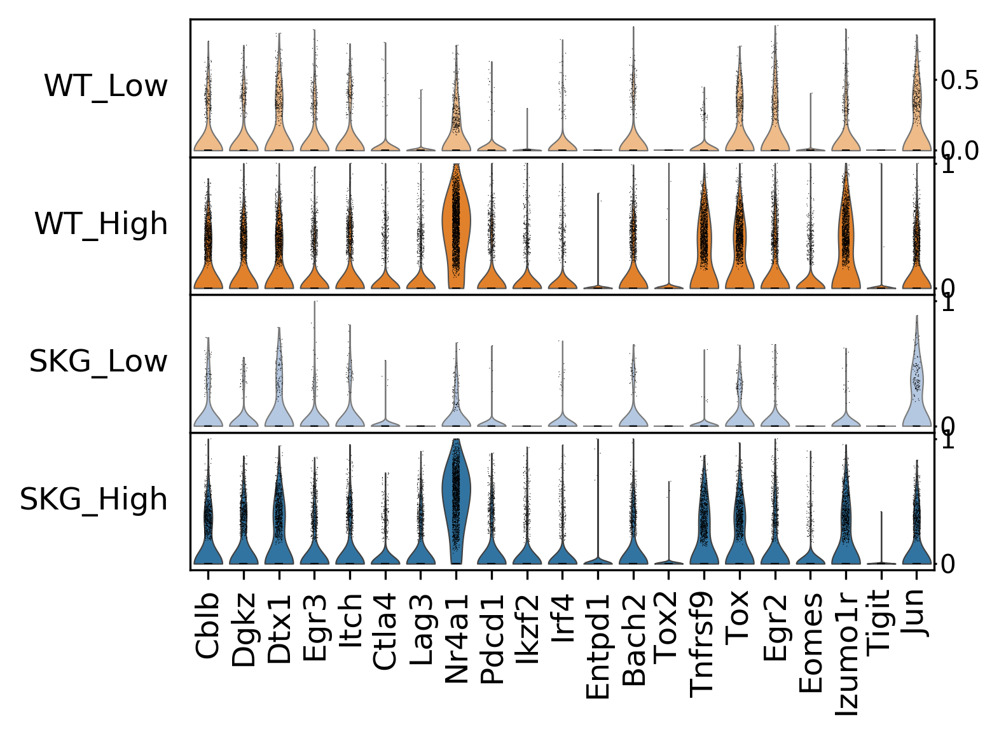

In [27]:
#Anergy/Exhuastion

genes = ["Cblb","Dgkz", "Dtx1", "Egr3", "Itch","Ctla4", "Lag3", "Nr4a1","Pdcd1",'Ikzf2','Irf4','Entpd1',
         'Bach2', 'Tox2',"Tnfrsf9",'Tox',  "Egr2",'Eomes',"Izumo1r",'Tigit', 'Jun']

sc.pl.stacked_violin(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, stripplot = True, jitter = True, row_palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], size = 0.3, bw=0.5)#save = "fig2_violin_plot_Nr4a1_high_cluster_anergy.svg")

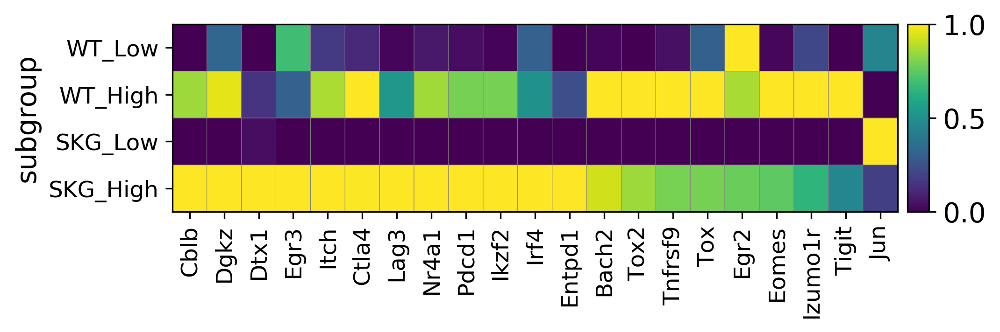

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[6.72, 0, 0.2])

In [55]:
#Anergy/Exhaustion
genes = ["Cblb","Dgkz", "Dtx1", "Egr3", "Itch","Ctla4", "Lag3", "Nr4a1","Pdcd1",'Ikzf2','Irf4','Entpd1',
         'Bach2', 'Tox2',"Tnfrsf9",'Tox',  "Egr2",'Eomes',"Izumo1r",'Tigit', 'Jun']

sc.pl.matrixplot(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False,  save = "fig2_heatmap_Nr4a1_high_cluster_anergy.svg")

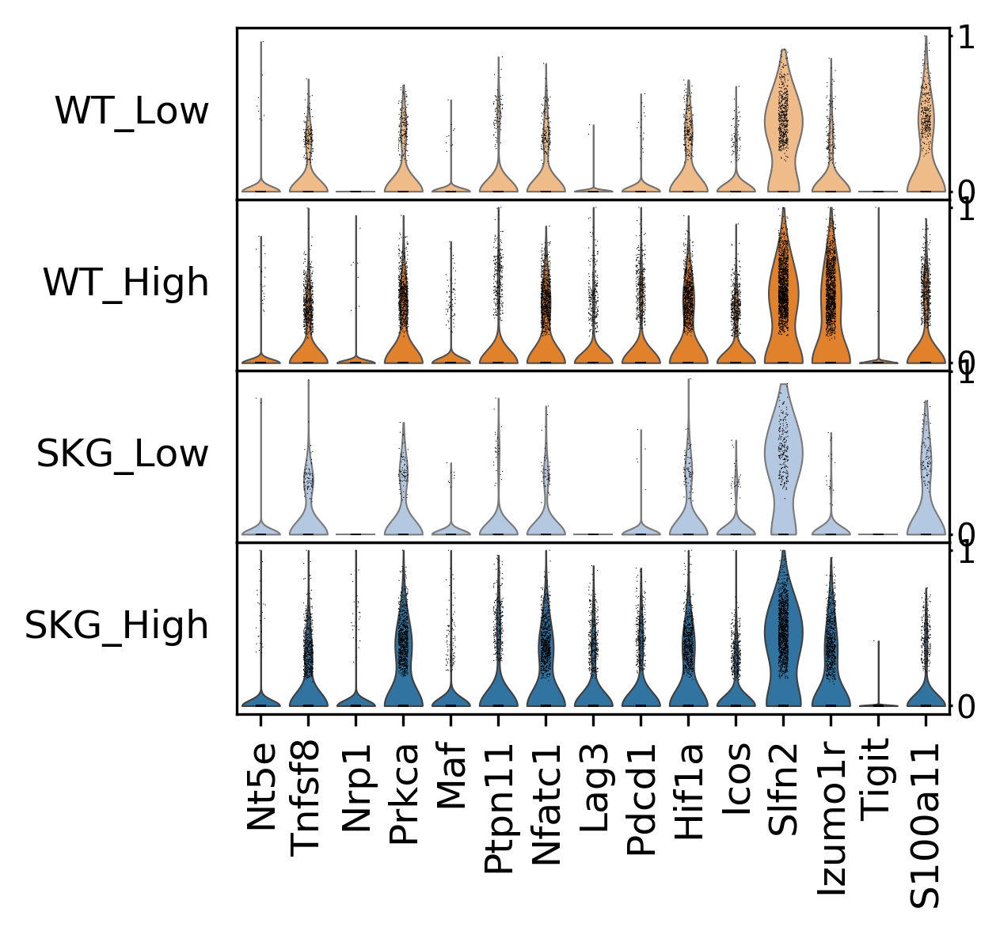

In [12]:
#Anergy/Exhuastion

genes = ['Nt5e', 'Tnfsf8', 'Nrp1', 'Prkca', 'Maf', 'Ptpn11',
       'Nfatc1', 'Lag3', 'Pdcd1', 'Hif1a','Icos', 'Slfn2',  'Izumo1r', 'Tigit', 'S100a11']

sc.pl.stacked_violin(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, stripplot = True, jitter = True, row_palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], size = 0.3, bw=0.5,save = "fig2_violin_plot_Nr4a1_high_cluster_natural_anergy_2H.svg")

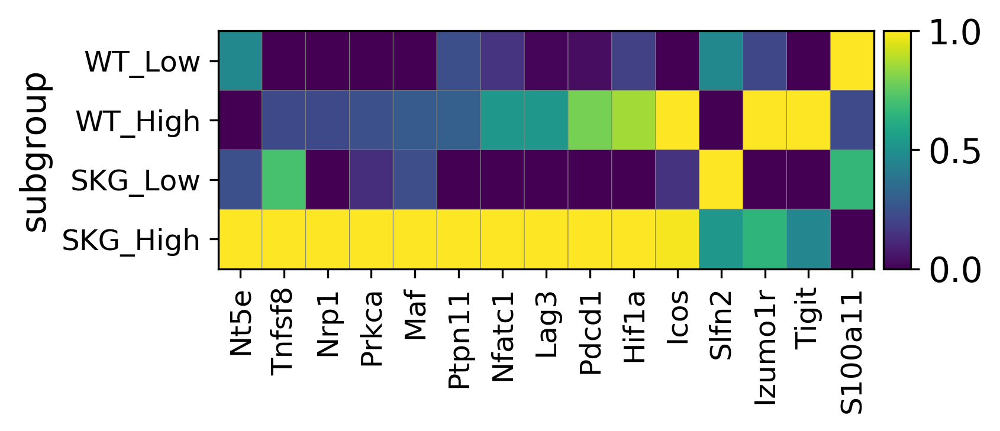

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[4.8, 0, 0.2])

In [11]:


#Natural anergy
genes = ['Nt5e', 'Tnfsf8', 'Nrp1', 'Prkca', 'Maf', 'Ptpn11',
       'Nfatc1', 'Lag3', 'Pdcd1', 'Hif1a','Icos', 'Slfn2',  'Izumo1r', 'Tigit', 'S100a11']

sc.pl.matrixplot(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False,  save = "fig2_heatmap_Nr4a1_high_cluster_natural_anergy_2H.svg")

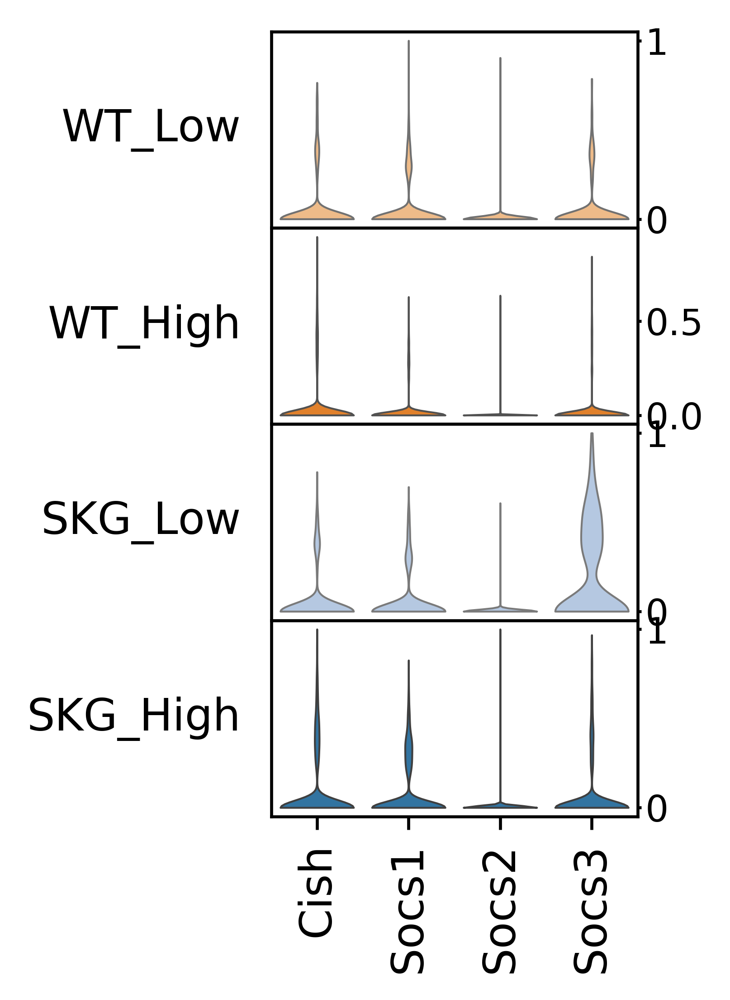

In [66]:
#Nra41/Socs3

genes = ["Cish", "Socs1", "Socs2", "Socs3"]
adata_subset = adata[adata.obs['cell_types'] == '3']
sc.pl.stacked_violin(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, row_palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], size = 0.3) #,order = order)#, row_palette = )



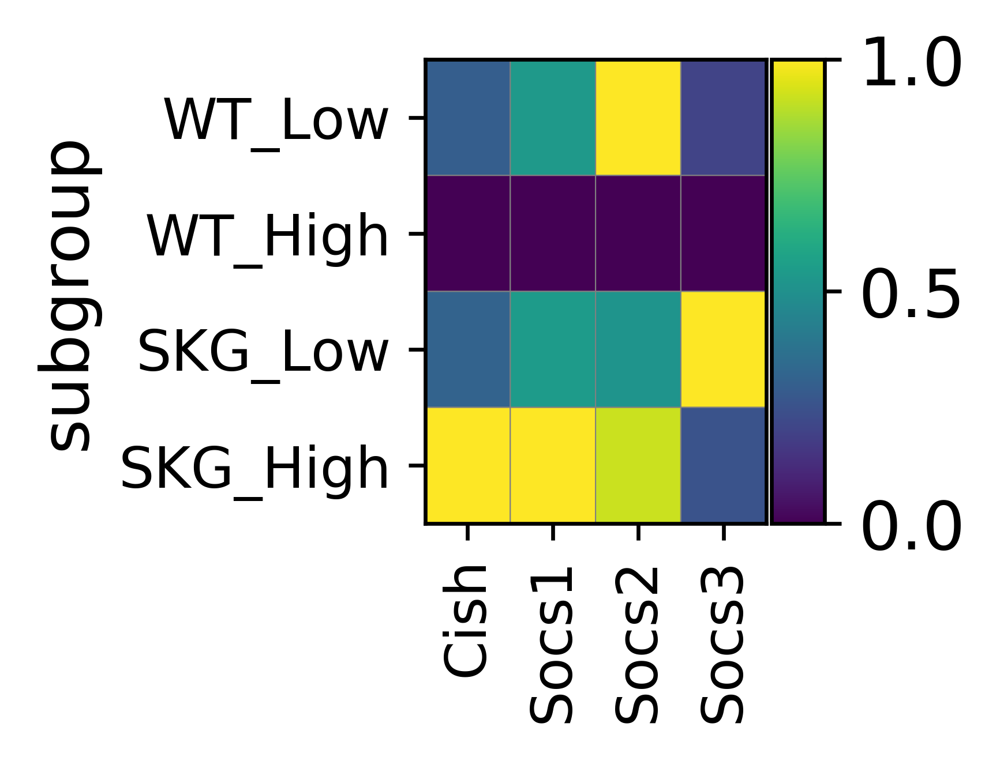

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[1.28, 0, 0.2])

In [75]:
#Nra41/Socs3

genes = ["Cish", "Socs1", "Socs2", "Socs3"]

sc.pl.matrixplot(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False)

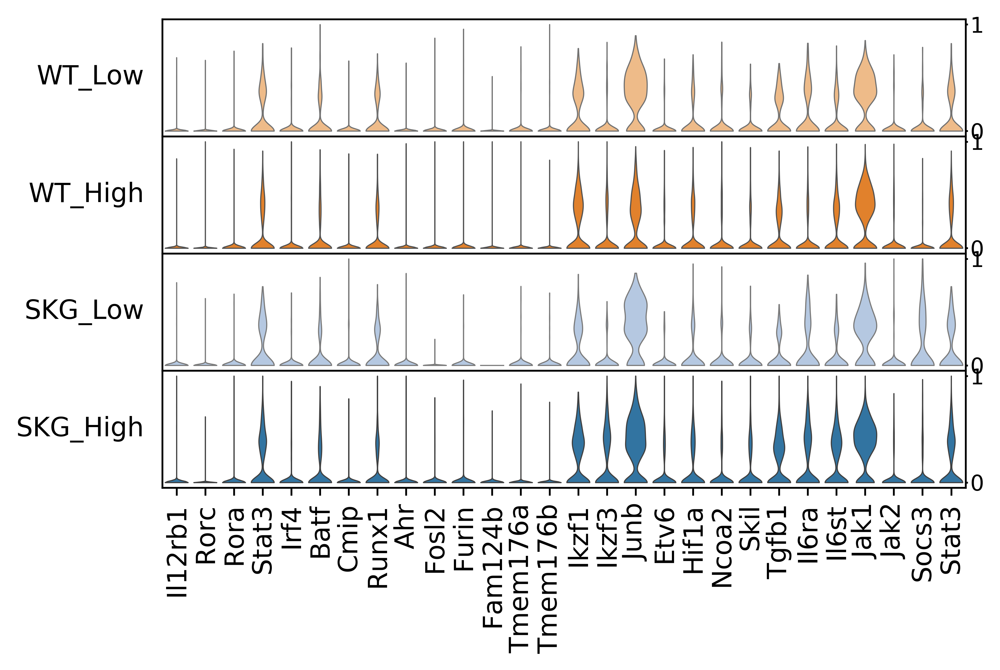

In [69]:
#Th17/Il6

genes = ['Il12rb1',"Rorc","Rora",  "Stat3", "Irf4", 
"Batf", "Cmip", "Runx1", "Ahr", "Fosl2", "Furin", 
"Fam124b", "Tmem176a", "Tmem176b", "Ikzf1", "Ikzf3", 
"Junb", "Etv6", "Hif1a", "Ncoa2", "Skil", "Tgfb1","Il6ra","Il6st", "Jak1", "Jak2", "Socs3", "Stat3"]

sc.pl.stacked_violin(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False, row_palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], size = 0.3) #,order = order)#, row_palette = )

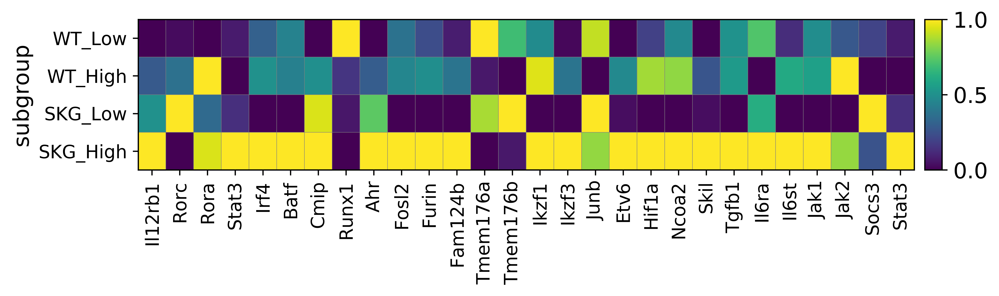

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.96, 0, 0.2])

In [76]:
#Th17/Il6

genes = ['Il12rb1',"Rorc","Rora",  "Stat3", "Irf4", 
"Batf", "Cmip", "Runx1", "Ahr", "Fosl2", "Furin", 
"Fam124b", "Tmem176a", "Tmem176b", "Ikzf1", "Ikzf3", 
"Junb", "Etv6", "Hif1a", "Ncoa2", "Skil", "Tgfb1","Il6ra","Il6st", "Jak1", "Jak2", "Socs3", "Stat3"]

sc.pl.matrixplot(adata_subset, genes, groupby = 'subgroup', use_raw = True, standard_scale = 'var',
              swap_axes = False)

# Dot Plot for Cell Type Markers

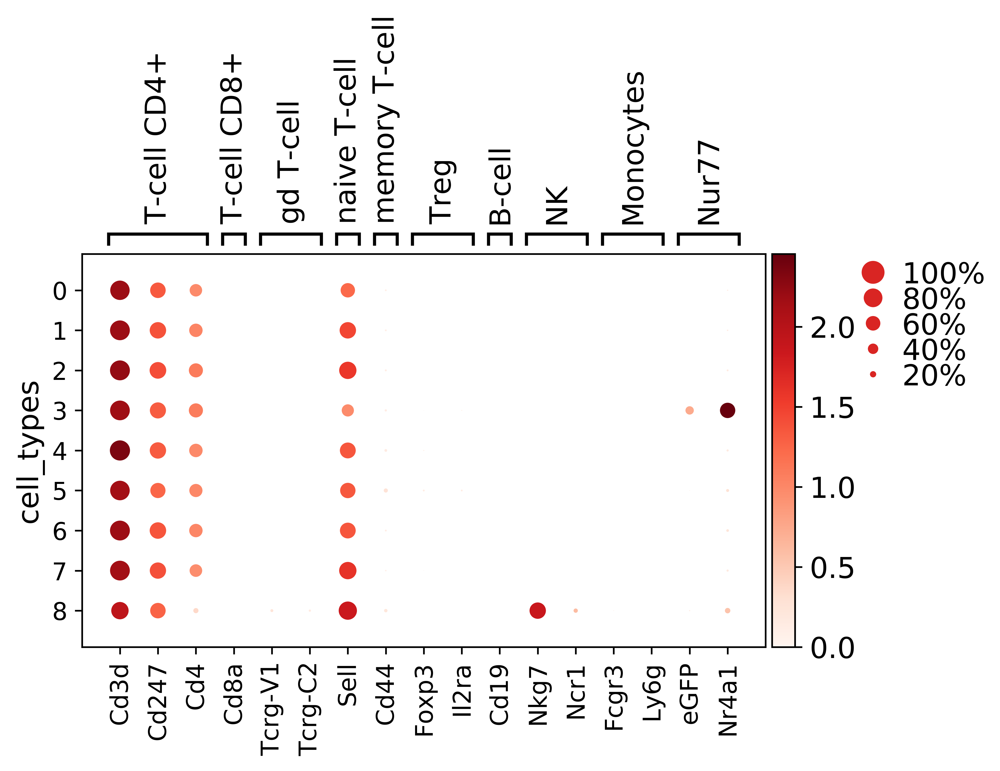

In [18]:

sc.set_figure_params(dpi=300)

marker_genes_dict = {'T-cell CD4+': ['Cd3d', 'Cd247', 'Cd4'],
                     'T-cell CD8+': ['Cd8a'],
                     'gd T-cell': ['Tcrg-V1','Tcrg-C2'],
                    'naive T-cell':['Sell'],
                       'memory T-cell':['Cd44'],
                       'Treg':['Foxp3','Il2ra'],
                     'B-cell': ['Cd19'],
                     'NK': ['Nkg7','Ncr1'],
                     'Monocytes': ['Fcgr3','Ly6g'],
                     'Nur77': ['eGFP','Nr4a1']}

ax = sc.pl.dotplot(adata, marker_genes_dict, groupby='cell_types')#, save = '_marker_genes_by_cell_subtypes.svg')

# Distribution over cell sub-types by subgroup

In [19]:
def barplot_grouped_obs_cat(adata, obs_cat, group_names, grouping_dict, sample, file_save_prefix = None, x_label = None, y_label = None, title = None, save_file = False):
    #adata  = adata object
    #obs_cat = category that you will create counts of for each sample
    #group_names = unique names of categories in obs_cat in order you want them to appear
    #grouping_dict = dictionary between sample names and grouping for box plot
    #sample = name of .obs category that holds the sample names
    all_values = dict()
    for sample_name in np.unique(adata.obs[sample]):
        names, counts = np.unique(adata[adata.obs[sample] == sample_name].obs[obs_cat], return_counts = True)
        counts = counts/np.sum(counts)*100
        values = dict(zip(names, counts))
        sample_name_values = list()
        for name in group_names:
            sample_name_values = sample_name_values + [values.get(name, 0)]
        all_values[sample_name] = sample_name_values
        #print(sample_name)
    df_all = pd.DataFrame(all_values)
    df_all.index = group_names
    
    df_all = df_all.T
    df_all["sample"] = df_all.index
    df_all["group"] = [grouping_dict[x] for x in df_all.index]
    df_all = df_all.set_index(['sample', 'group'])
    b = df_all.T.unstack(level=0)
    b = pd.DataFrame(b)
    b = b.reset_index()
    b.columns = ['sample', 'group', obs_cat, 'Abundance']
    b[obs_cat] = [int(x) for x in b[obs_cat]]
    ax = sns.barplot(x=obs_cat, y='Abundance', hue="group",data=b, palette=["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], hue_order = ["WT_Low","WT_High",'SKG_Low','SKG_High'])
    plt.xticks(rotation = 90, fontsize = 10)
    if x_label != None:
        plt.xlabel(x_label, fontsize = 10)
    if title != None:
        plt.title(title, fontsize = 10)
    plt.ylabel("% of all cells", fontsize = 10)
    #plt.title(score_name, fontsize = 10)
    plt.yticks(fontsize = 10)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    if save_file:
        plt.savefig(file_save_prefix + "fig_2_abundance_for_new_leiden_clusters_by_subgroup.eps", format="eps")
    plt.show()
    plt.close()
    return b

In [20]:
mouse_group_dict =  {'0': "SKG_High", '4': "SKG_High", '2': "WT_High", '6': "WT_High", '3': "WT_Low", '7': "WT_Low", '1': "SKG_Low", '5': "SKG_Low"}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


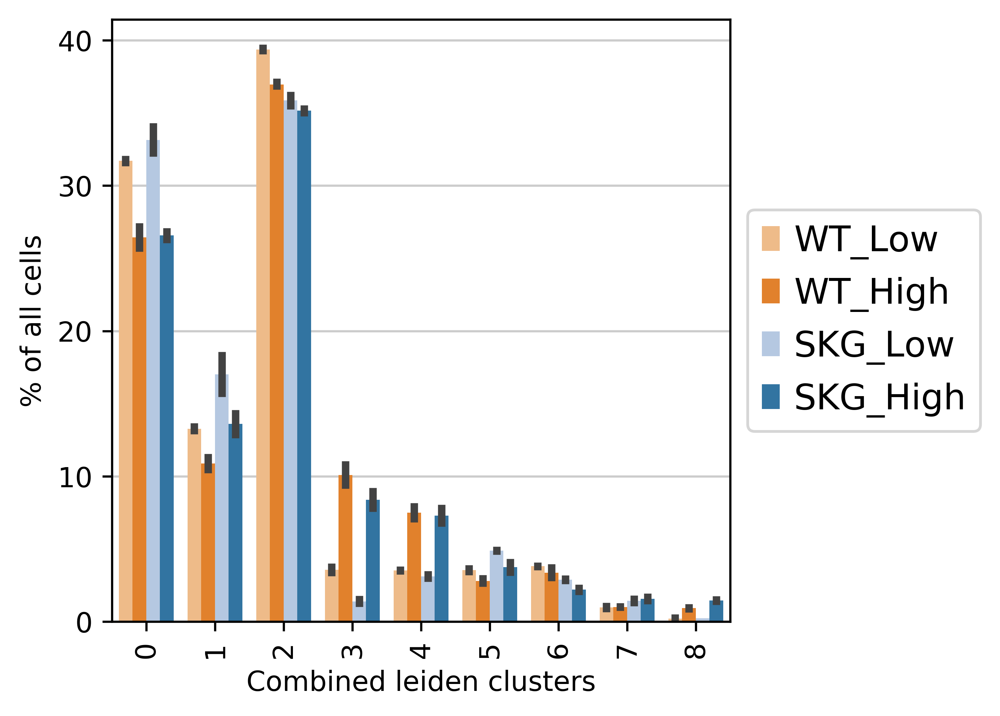

In [21]:
plt.rc('axes', axisbelow=True)
file_prefix = "results/single_cell_RNA_seq/"

df = barplot_grouped_obs_cat(adata, 'cell_types', list(cell_type_dict.values()), mouse_group_dict , 'batch', x_label = "Combined leiden clusters") #, file_save_prefix = file_prefix, save_file = True)


# Scoring for bulk RNA Seq modules (part 1)

In [5]:
sample_list = pd.read_csv('data/sc_RNA_sample_sheet.csv', sep = ',')
sample_list['sample_names'] = [str(x) + '_' + y + '_' + z for x,y,z in zip(sample_list['mouse'],sample_list['genotype'],sample_list['GFP'])]
no_wells = sample_list.shape[0]
RNA_adata = [None]* no_wells


sample_names = np.array(sample_list['sample_names'])
path = '/wynton/group/ye/emccarthy/EM/judy_proj/pre_processing_mouse_001/'#fill in directory location with saved adata objects
adata_files = [path + x + '.h5ad' for x in sample_names]
for index in range(len(adata_files)):
    RNA_adata[index] = sc.read(adata_files[index])

In [6]:
adata_raw = RNA_adata[0].concatenate(RNA_adata[1],RNA_adata[2],RNA_adata[3],RNA_adata[4],RNA_adata[5],RNA_adata[6],RNA_adata[7])
adata_raw = adata_raw[adata.obs.index]
adata_raw.obs['cell_types'] = adata.obs['cell_types']

Trying to set attribute `.obs` of view, copying.


In [7]:
gene_modules = pd.read_csv("results/bulk_RNA_seq/heatmap_gene_list_with_modules_08102021.csv")

FileNotFoundError: [Errno 2] File results/bulk_RNA_seq/heatmap_gene_list_with_modules_08102021.csv does not exist: 'results/bulk_RNA_seq/heatmap_gene_list_with_modules_08102021.csv'

In [8]:
sc.pp.filter_genes(adata_raw, min_cells=3)
sc.pp.normalize_total(adata_raw, target_sum=1e4)   
#Log transform the data
sc.pp.log1p(adata_raw)
sc.pp.scale(adata_raw)

filtered out 14804 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Scoring for Vista TCR Activation

In [ ]:
#To score all the vista clusters
for cluster in list(range(2)):
    module = 'vista_cluster_'+str(cluster)
    filtered_df = df[df['Cluster assignment'] == cluster]

    # Extract the 'Gene' column from the filtered DataFrame and convert it to a list
    gene_list = filtered_df['Gene'].tolist()

    # Print the resulting list of genes
    print(gene_list)
    sc.tl.score_genes(adata_raw, gene_list, score_name =module)

    adata.obs[module] = adata_raw.obs[module]
    sc.pl.umap(adata, color=module, frameon=False,cmap = 'bwr')

    adata_subset = adata[adata.obs['cell_types'] == '3']

    sc.pl.violin(adata_subset, module, groupby = 'subgroup', rotation = 90, palette = ["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"])

In [ ]:
import pandas as pd

# Read the Excel file into a pandas DataFrame
df = pd.read_excel("data/Table_S1.xls")

# Filter the DataFrame based on entries of 4 in the 'Cluster assignment' column
filtered_df = df[df['Cluster assignment'] == 4]

# Extract the 'Gene' column from the filtered DataFrame and convert it to a list
gene_list = filtered_df['Gene'].tolist()

# Print the resulting list of genes
print(gene_list)

In [ ]:
#To score Vista Cluster 4
module = 'vista_cluster_4'
sc.tl.score_genes(adata_raw, gene_list, score_name =module)

adata.obs[module] = adata_raw.obs[module]


In [3]:
adata_test = adata[adata.obs['cell_types'] == '3']
adata_test.obs['Tnf_cat'] = [(x>1, y>1) for x,y in zip(np.array(adata_test.raw[:,"Tnfrsf9"].X.todense()).ravel(),np.array(adata_test.raw[:,"Egr2"].X.todense()).ravel())]
conversion = {(False,False): "EgrnegTnfrsf9neg",(False,True):"Egr2 High", (True, False):"Tnfrsf9 High", (True,True):"EgrposTnfrsf9pos"}
adata_test.obs['Tnf_Egr_cat'] = [conversion[x] for x in adata_test.obs['Tnf_cat']]
adata_test = adata_test[[x in ['Egr2 High', 'Tnfrsf9 High'] for x in adata_test.obs['Tnf_Egr_cat']]]

Trying to set attribute `.obs` of view, copying.


In [21]:
import statsmodels.formula.api as smf
score_name = 'vista_cluster_4'
test = adata_test.obs[[score_name,'mouse','Tnf_Egr_cat']]

my_model_fit = smf.mixedlm(score_name +' ~ Tnf_Egr_cat ', re_formula='1', groups='mouse', data=test).fit()
# get random effects
my_model_fit.random_effects
# get fixed effects
print(score_name)
print(my_model_fit.summary())

#No convergence see documentation here: https://github.com/statsmodels/statsmodels/issues/5546. Updating to method = 'cg' in fit did not fix issue
#I think ok to ignore warnings because the coef and std error for the random effects are often ignored and in this case are very small.
#https://github.com/statsmodels/statsmodels/issues/6157
#Note that inference for variance parameters is not meaningful when the point estimate is at or near zero

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2112: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2112: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


vista_cluster_4
                Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   vista_cluster_4
No. Observations:     2715      Method:               REML           
No. Groups:           4         Scale:                0.0901         
Min. group size:      451       Log-Likelihood:       -594.9330      
Max. group size:      949       Converged:            No             
Mean group size:      678.8                                          
---------------------------------------------------------------------
                            Coef. Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------
Intercept                   0.208    0.022  9.463 0.000  0.165  0.251
Tnf_Egr_cat[T.Tnfrsf9 High] 0.261    0.012 21.106 0.000  0.237  0.285
mouse Var                   0.002                                    



/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2118: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2130: ConvergenceWarning: Gradient optimization failed, |grad| = 20.723451
  warnings.warn(msg, ConvergenceWarning)
/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2149: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, Conve

In [11]:
my_model_fit.pvalues

Intercept                      2.988244e-21
Tnf_Egr_cat[T.Tnfrsf9 High]    6.982669e-99
mouse Var                               NaN
dtype: float64

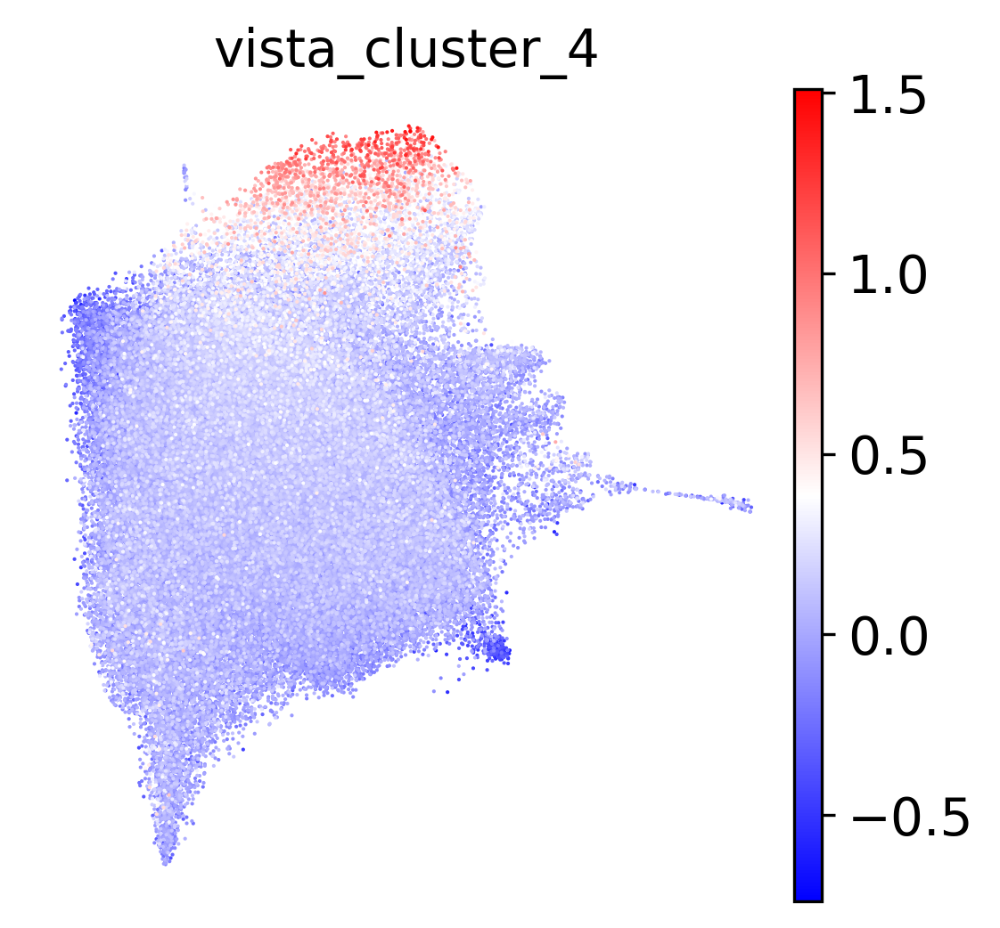

/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'Tnf_cat' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Tnf_Egr_cat' as categorical


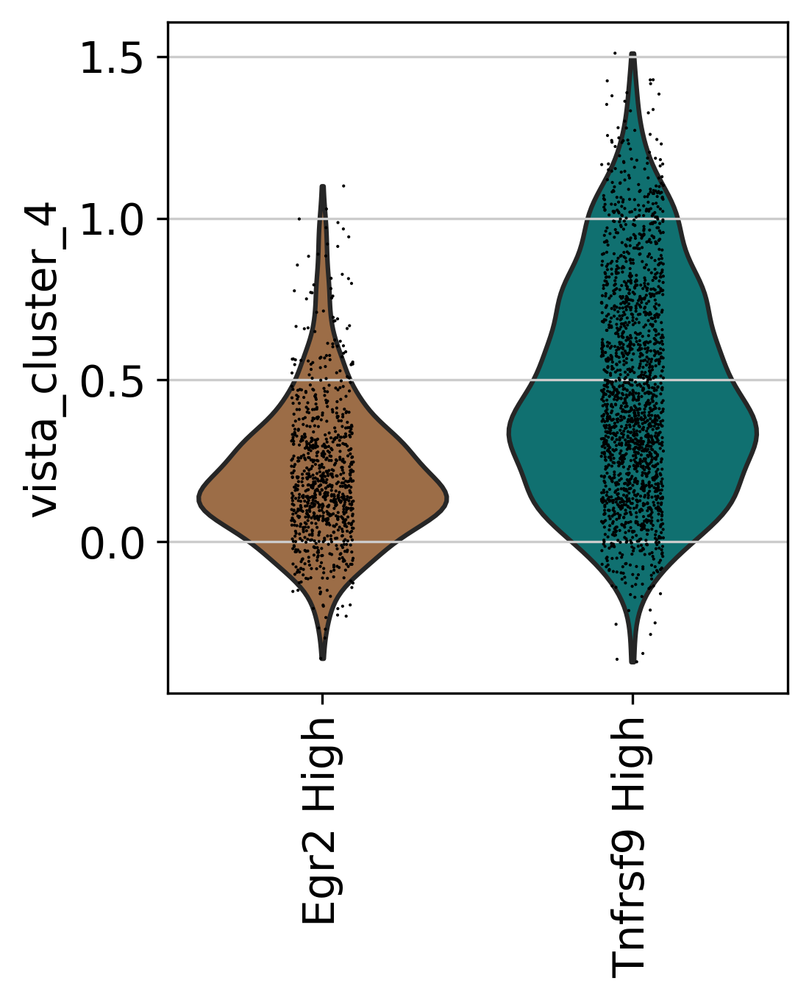

In [15]:
module = 'vista_cluster_4'
sc.pl.umap(adata, color=module, frameon=False,cmap = 'bwr',save = "_vista_cluster_4_tcr_activation_score.svg", size = 4) 
sc.pl.violin(adata_test, module, groupby = 'Tnf_Egr_cat', rotation = 90, palette = ['#aa6c39','#008080'], save = "_vista_cluster_4_Egr2_pos_versus_Tnfrsf9_pos_Nr4a1_high_cluster.svg")

# Scoring for bulk RNA Seq modules (part 2)

In [30]:
for i in list(range(1,7)):
    gene_list = np.array(gene_modules[gene_modules['module'] == i]['gene'])
    sc.tl.score_genes(adata_raw, gene_list, score_name = "module_" +str(i))

computing score 'module_1'
    finished: added
    'module_1', score of gene set (adata.obs).
    1192 total control genes are used. (0:00:15)
computing score 'module_2'
    finished: added
    'module_2', score of gene set (adata.obs).
    1181 total control genes are used. (0:00:15)
computing score 'module_3'
    finished: added
    'module_3', score of gene set (adata.obs).
    1183 total control genes are used. (0:00:15)
computing score 'module_4'
    finished: added
    'module_4', score of gene set (adata.obs).
    1194 total control genes are used. (0:00:15)
computing score 'module_5'
    finished: added
    'module_5', score of gene set (adata.obs).
    1096 total control genes are used. (0:00:15)
computing score 'module_6'
    finished: added
    'module_6', score of gene set (adata.obs).
    1143 total control genes are used. (0:00:14)


In [31]:
def heatmap_sg(gene_1, cor_data, vmin = -0.5, vmax = 0.5, file_save = None, mask = False):
    
    sns.set(font_scale=3, rc={'axes.facecolor':'darkgrey'})
    gene_set_1 = list(cor_data.sort_values(by=gene_1, axis=1, ascending = False).loc[gene_1,:][0:25].index)

    gene_set_2 = list(cor_data.sort_values(by=gene_1, axis=1, ascending = True).loc[gene_1,:][0:25].index)
    if mask == True:
        #mask = np.triu(np.ones_like(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], dtype=bool))
        #fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask = mask, yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
        #mask = mask[np.argsort(fig.dendrogram_row.reordered_ind),:]
        #mask = mask[:,np.argsort(fig.dendrogram_col.reordered_ind)]
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], mask=(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2]==1), yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
        #fig.set_facecolor('xkcd:white')
    else:
        fig = sns.clustermap(cor_data.loc[gene_set_1 + gene_set_2,gene_set_1 + gene_set_2], yticklabels=True, xticklabels=True, cmap="RdBu_r",figsize=(30, 30), row_cluster=True, col_cluster=True, vmin = vmin, vmax = vmax )
    #plt.title()
    if file_save != None:
        plt.savefig(file_save +".svg", format="svg")
    plt.show()

In [34]:
df_long = pd.DataFrame({'cluster':adata_raw.obs['cell_types'], 'module_1':adata_raw.obs['module_1'], 'module_2':adata_raw.obs['module_2'],
                       'module_3':adata_raw.obs['module_3'],'module_4':adata_raw.obs['module_4'],
                       'module_5':adata_raw.obs['module_5'],'module_6':adata_raw.obs['module_6']})
df_long.index = df_long['cluster']
df_cast = df_long.groupby(df_long.index).median()
df_cast_sub = df_cast.iloc[:-1,:]

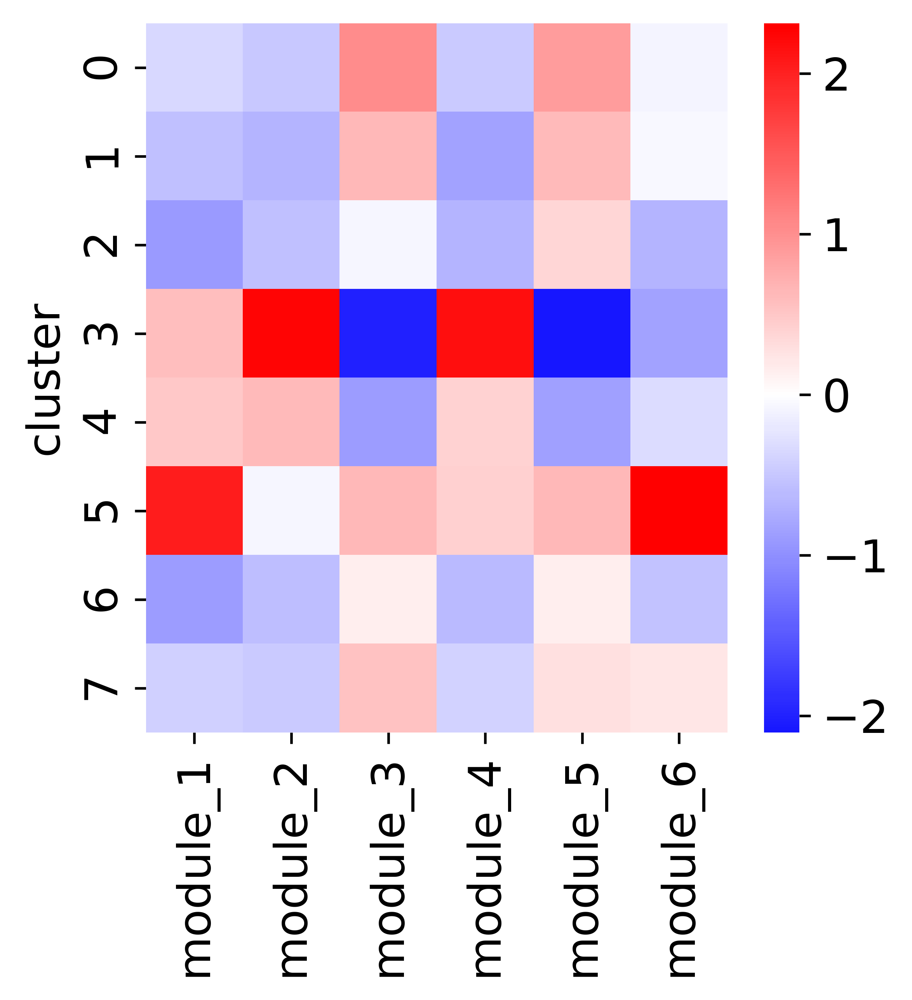

In [35]:
df_norm_col=(df_cast_sub-df_cast_sub.mean())/df_cast_sub.std()

#file_prefix = "results/single_cell_RNA_seq/"
#file_save = file_prefix + "heatmap_median_expression_gene_modules_by_cluster_norm_by_column_no_cluster_8.svg"
fig = sns.heatmap(df_norm_col,cmap='bwr', center = 0)
#plt.savefig(file_save, format="svg")
plt.show()
plt.close()

# Calculate Cell Cycle

In [36]:
s_df = pd.read_csv('data/G1_S.csv')
s_genes = np.array(s_df['G1_S'])
m_df = pd.read_csv('data/G2_M.csv')
g2m_genes = np.array(m_df['G2_M'])

In [37]:
sc.tl.score_genes_cell_cycle(adata_raw, s_genes=s_genes, g2m_genes=g2m_genes)
adata.obs['S_score'] = adata_raw.obs['S_score']
adata.obs['G2M_score'] = adata_raw.obs['G2M_score']
adata.obs['phase'] = adata_raw.obs['phase']

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    1383 total control genes are used. (0:00:15)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    1575 total control genes are used. (0:00:16)
-->     'phase', cell cycle phase (adata.obs)


In [39]:
for i in list(range(1,7)):
    adata.obs['module_' + str(i)] = adata_raw.obs['module_' + str(i)]


# Save adata object

In [53]:
adata

AnnData object with n_obs × n_vars = 99074 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params', 'cell_types_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [54]:
adata.write('adata_object/adata_only_T_cells.h5ad')